In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from time import time
%matplotlib inline
plt.rcParams['figure.dpi'] = 70 #display 70 dpi in Jupyter Notebook, may consider100 dpi 
plt.rcParams['savefig.dpi'] = 300 #define 300 dpi for saving figures
import seaborn as sns
## here are some settings 
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":70, 'savefig.dpi':300}) #defining dpi setting
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

In [38]:
fire = pd.read_csv('FW_Veg_Rem_Combined.csv', delimiter=',')
fire.dataframeName
row, col = fire.shape
print(f'There are {row} rows and {col} columns')

There are 55367 rows and 43 columns


In [39]:
fire.head(5)

,Unnamed: 0,Unnamed: 0.1,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,disc_clean_date,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
0,0,0,NaN,10.0,C,Missing/Undefined,18.105072,-66.753044,PR,2/11/2007,...,3.250413,78.216590,76.793750,76.381579,78.724370,0.0,0.0,0.0,0.0,0.017923
1,1,1,NaN,3.0,B,Arson,35.038330,-87.610000,TN,12/11/2006,...,2.122320,70.840000,65.858911,55.505882,81.682678,59.8,8.4,0.0,86.8,0.184355
2,2,2,NaN,60.0,C,Arson,34.947800,-88.722500,MS,2/29/2004,...,3.369050,75.531629,75.868613,76.812834,65.063800,168.8,42.2,18.1,124.5,0.194544
3,3,3,WNA 1,1.0,B,Debris Burning,39.641400,-119.308300,NV,6/6/2005,...,0.000000,44.778429,37.140811,35.353846,0.000000,10.4,7.2,0.0,0.0,0.487447
4,4,4,NaN,2.0,B,Miscellaneous,30.700600,-90.591400,LA,9/22/1999,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.214633


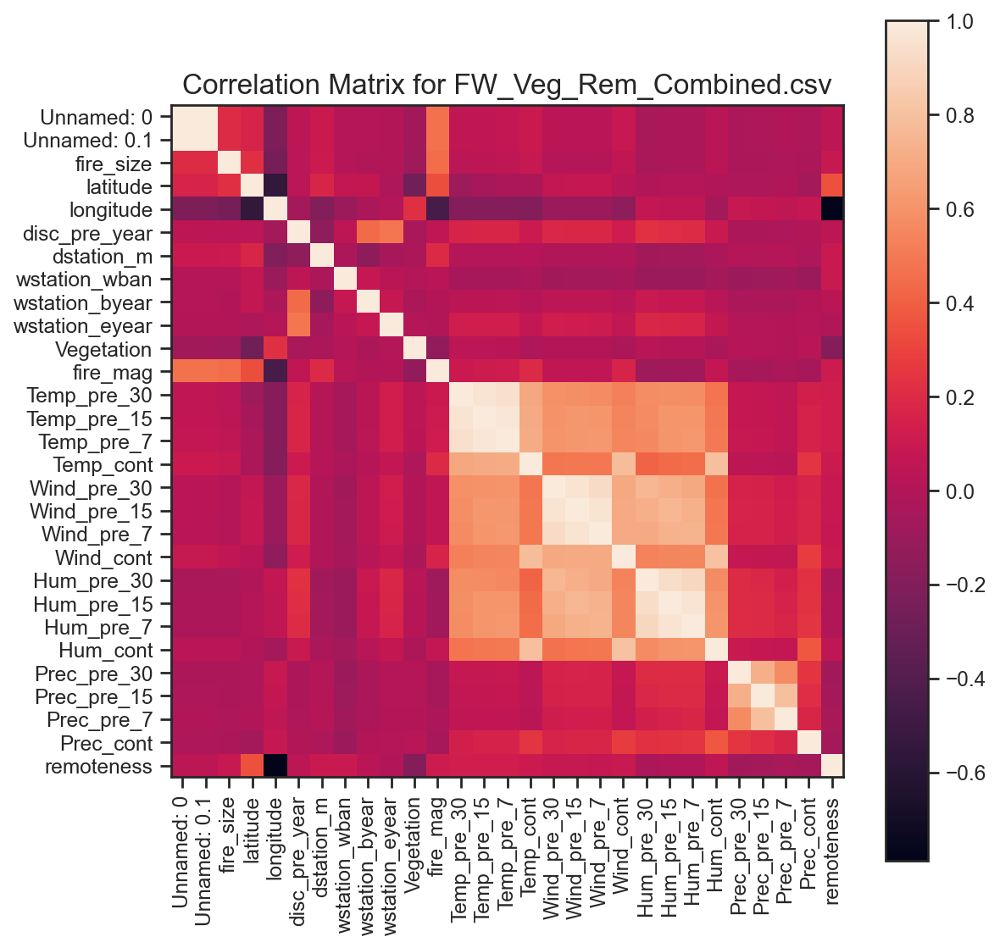

In [35]:
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()
    
plotCorrelationMatrix(fire, 8)

In [94]:
x = fire[["Temp_pre_30", "Temp_pre_15", "Temp_pre_7", "Temp_cont", "Wind_pre_30", "Wind_pre_15", "Wind_pre_7",
          "Wind_cont", "Hum_pre_30", "Hum_pre_15", "Hum_pre_7", "Hum_cont", "Prec_pre_30", "Prec_pre_15", 
          "Prec_pre_7", "Prec_cont", "remoteness"]]
z = fire[["Temp_pre_30", "Temp_pre_15", "Temp_pre_7", "Temp_cont", "Wind_pre_30", "Wind_pre_15", "Wind_pre_7",
          "Wind_cont", "Hum_pre_30", "Hum_pre_15", "Hum_pre_7", "Hum_cont", "Prec_pre_30", "Prec_pre_15", 
          "Prec_pre_7", "Prec_cont", "remoteness", "fire_size"]]
y = fire[["fire_size"]]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .2, random_state = 2)
mae = {}

In [49]:
from functools import singledispatchmethod
from typing import Generator, Tuple, Union
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error

errors = []
errMean = []

class LOPOCV:

    def __init__(self) -> None:
        pass

    @singledispatchmethod
    def split(self, X, y, groups=None):
        raise Exception(
            'Both X and y must be either a numpy array or DataFrame.'
        )

    @split.register
    def _(self, X: np.ndarray, y: np.ndarray, groups=None):
        ...

    @split.register
    def _(
        self, X: pd.DataFrame, y: Union[pd.DataFrame, pd.Series], groups=None
    ) -> Generator[Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame], None, None]:
        Xy = X.join(y)

        for id in y['ID'].unique():
            split, valset = Xy[Xy['ID'] != id], Xy[Xy['ID'] == id]
            yield (
                split.loc[:, X.columns],
                valset.loc[:, X.columns],
                split.loc[:, y.columns],
                valset.loc[:, y.columns]
            )

def LOPO(model):
    for x_train, x_test, y_train, y_test in LOPOCV().split(x, y):
        y_pred = model.predict(x_test)
        errors.append(float(mean_absolute_error(y_test, y_pred)))
    errMean.append(np.mean(errors))

In [64]:
from sklearn.linear_model import LinearRegression
linReg = LinearRegression().fit(x_train, y_train)
print(linReg.score(x_test, y_test))

0.01885004033364479


In [75]:
from sklearn.ensemble import GradientBoostingRegressor
boost = GradientBoostingRegressor(random_state=2).fit(x_train, y_train)
print(boost.score(x_test, y_test))

/Users/abc/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.1478973382113239


In [76]:
from sklearn.linear_model import Ridge
ridge = Ridge(alpha=1.0).fit(x_train, y_train)
print(ridge.score(x_test, y_test))

0.018847735214689187


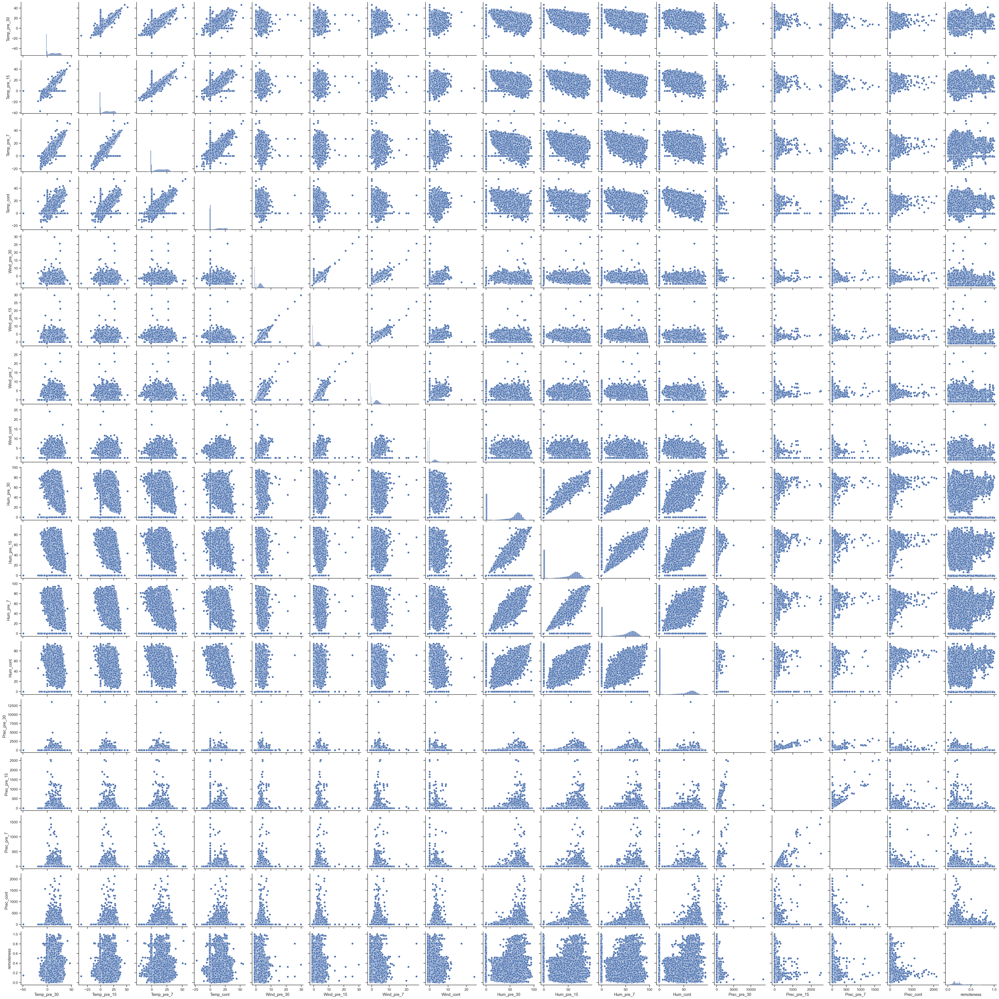

In [80]:
sns.pairplot(data=x)

In [97]:
model = sm.OLS.from_formula('fire_size ~  Temp_pre_30 + Temp_pre_15 + Temp_pre_7 + Temp_cont + Wind_pre_30 + Wind_pre_15 + Wind_pre_7 + Wind_cont + Hum_pre_30 + Hum_pre_15 + Hum_pre_7 + Hum_cont + Prec_pre_30 + Prec_pre_15 + Prec_pre_7 + Prec_cont + remoteness', fire)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:              fire_size   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     72.10
Date:                Sat, 30 Sep 2023   Prob (F-statistic):          2.84e-247
Time:                        22:03:12   Log-Likelihood:            -6.0952e+05
No. Observations:               55367   AIC:                         1.219e+06
Df Residuals:                   55349   BIC:                         1.219e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     943.0771    150.177      6.280      

Text(0.5, 1.0, 'Features Correlating with Fire Size')

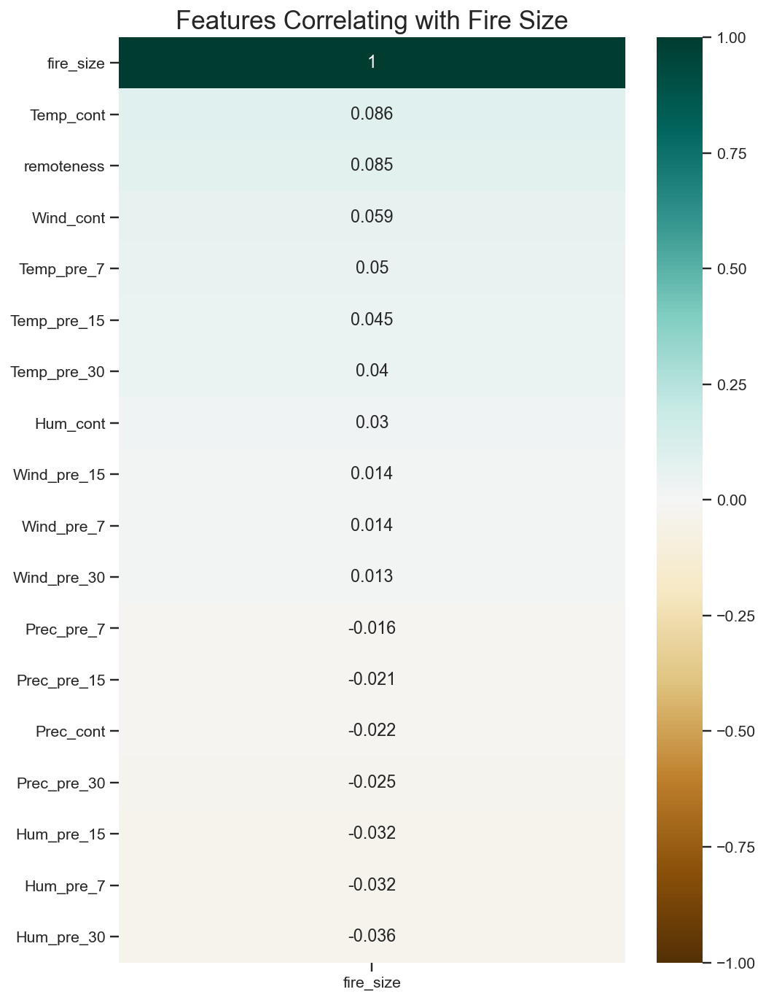

In [99]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(z.corr()[['fire_size']].sort_values(by='fire_size', 
    ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Fire Size', fontdict={'fontsize':18})